In [1]:
from io import BytesIO

import cv2
import matplotlib.pyplot as plt
import numpy as np
import polars as pl

In [4]:
# Read the parquet file, this takes a while. Leave it here
dft = pl.read_parquet("data/train.parquet", memory_map=True)
dfm = pl.read_parquet("data/meta_full.parquet", memory_map=True)
dft = dft.join(dfm, on="ClassId")
del dfm

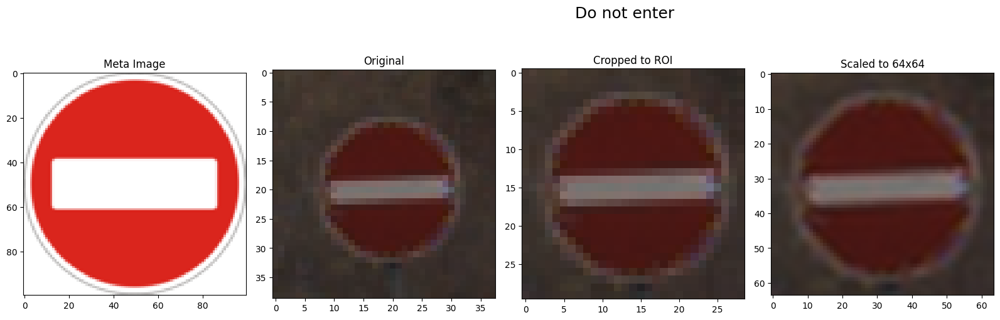

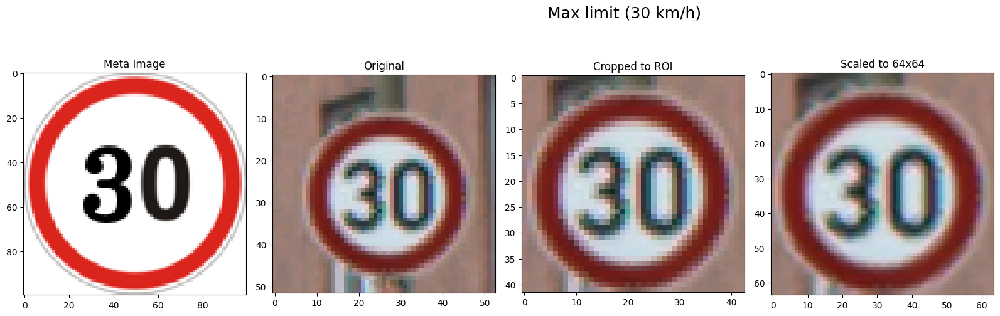

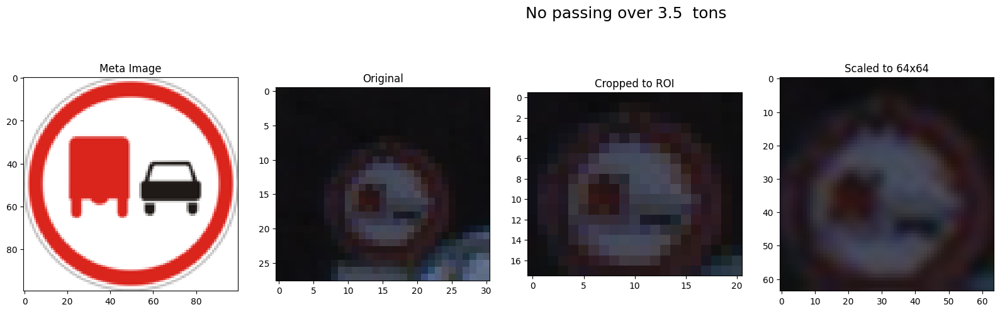

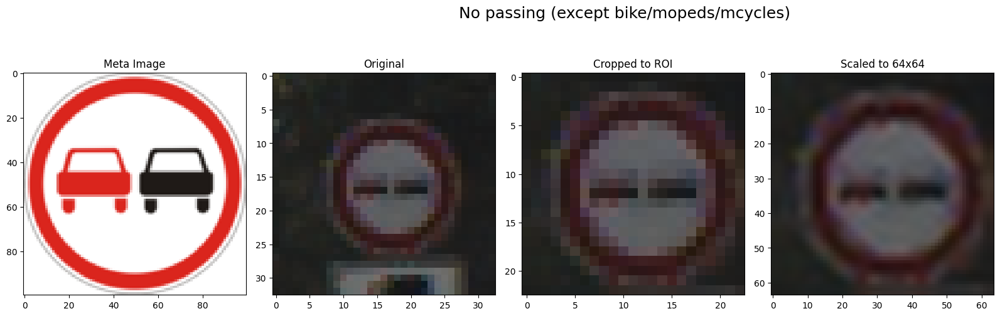

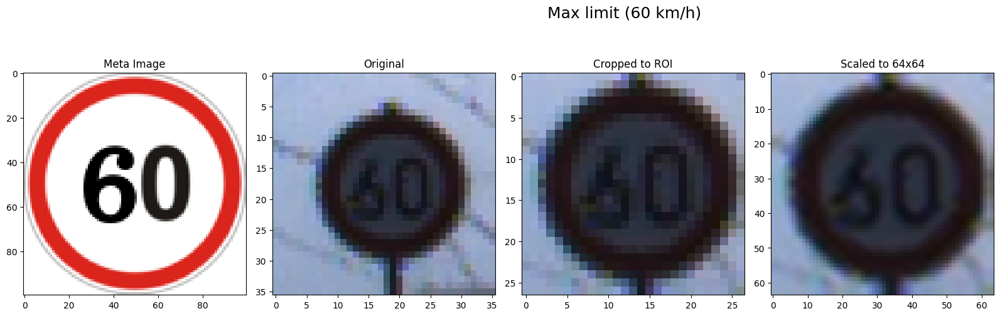

...

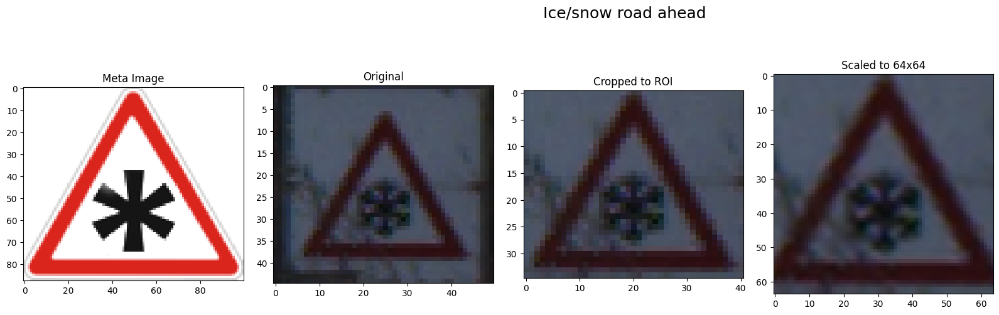

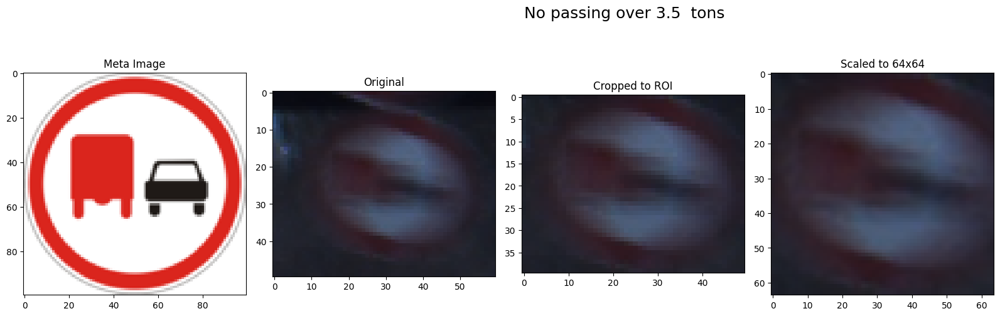

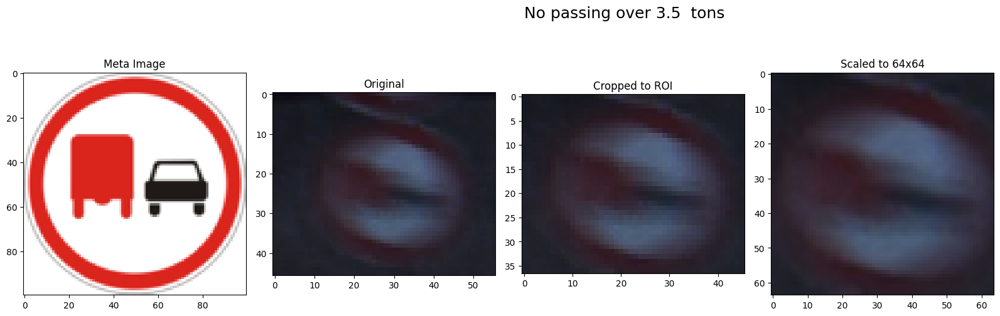

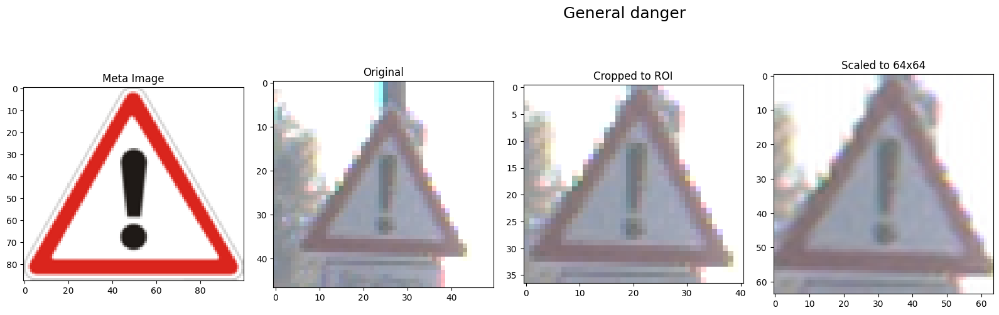

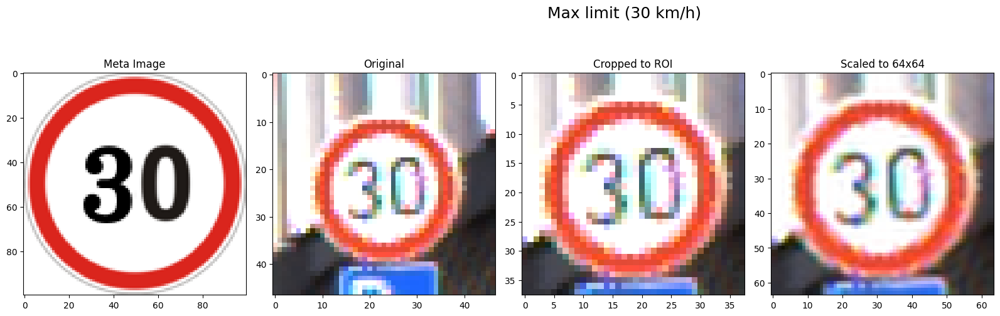

In [12]:
samples = dft.sample(100, with_replacement=False)

# iteration this way is not efficient, but it's a small dataset and we want to display it only
# no harm done
for r in samples.iter_rows(named=True):
    description = r["Description"]
    meta_image = np.load(BytesIO(r["Meta_Image"]))
    meta_image = (meta_image * 255.0).astype(np.uint8)
    image = np.load(BytesIO(r["Image"]))
    image = (image * 255.0).astype(np.uint8)
    cropped_image = np.load(BytesIO(r["Cropped_Image"]))
    cropped_image = (cropped_image * 255.0).astype(np.uint8)
    scaled_image = np.load(BytesIO(r["Scaled_Image"]))
    scaled_image = (scaled_image * 255.0).astype(np.uint8)
    # equalized_image = restore_image_from_list(
    #     r["Scaled_Width"], r["Scaled_Height"], r["Stretched_Histogram_Image"]
    # )
    # equalized_image = (equalized_image * 255.0).astype(np.uint8)
    # hsv_equalized_image = restore_image_from_list(
    #    r["Scaled_Width"], r["Scaled_Height"], r["Stretched_LAB_Histogram_Image"]
    # )
    # hsv_equalized_image = (hsv_equalized_image * 255.0).astype(np.uint8)

    n_row = 1
    n_col = 5
    fig = plt.figure(figsize=(20, 5.5))
    fig.suptitle(description, fontsize=18)
    ax = fig.add_subplot(n_row, n_col, 1)
    ax.imshow(meta_image)
    ax.set_title("Meta Image", size=12)
    ax = fig.add_subplot(n_row, n_col, 2)
    ax.imshow(image)
    ax.set_title("Original", size=12)
    ax = fig.add_subplot(n_row, n_col, 3)
    ax.imshow(cropped_image)
    ax.set_title("Cropped to ROI", size=12)
    ax = fig.add_subplot(n_row, n_col, 4)
    ax.imshow(scaled_image)
    ax.set_title("Scaled to 64x64", size=12)
    # ax = fig.add_subplot(n_row, n_col, 4)
    # ax.imshow(equalized_image)
    # ax.set_title("Stretch Histogram", size=12)
    # ax = fig.add_subplot(n_row, n_col, 5)
    # ax.imshow(hsv_equalized_image)
    # ax.set_title("Stretch Histogram HSV", size=12)
    fig.tight_layout()
    plt.show()